# Exploratory Data Analysis (EDA)

## Setup
- Data set was downloaded from Kaggle previously using the script `scripts/get_data.sh`
- Data set URL: https://www.kaggle.com/datasets/samuelcortinhas/muffin-vs-chihuahua-image-classification
- Data set was briefly examined in Kaggle's website, but more thorough EDA in Python still needs to be done, because there was close to no information given

## Goals
- Analyze content of the images
- Explore the downloaded data set and see what needs to be done to use it in a machine learning pipeline


### Basic Dataset Statistics
- verify class distribution in both train and test sets
- confirm total number of images
- verify directory structure integrity

### Image Properties
- image dimensions (width, height) - are they consistent?
- aspect ratios distribution
- color channels (RGB, grayscale, alpha channel?)
- file formats (jpg, png, etc.)
- file sizes
- image quality metrics (blurriness, brightness, contrast)

### Content Analysis
- image orientation check
- background complexity
- object positioning (centered vs off-center)
- lighting conditions
- presence of watermarks or text
- multiple objects in single images?
- different angles/viewpoints distribution
- presence of corrupted/unreadable images

### Technical Considerations
- memory requirements for batch processing
- estimate required preprocessing steps
- potential augmentation strategies based on findings
- identify potential data quality issues

## Preparations

In [18]:
# Dependencies
# ------------

# standard libraries
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from collections import Counter

# third party libraries
import numpy as np

# Paths
# -----

# path to the raw data
PATH_DATA = Path("../data")
PATH_DATA_RAW = PATH_DATA / "raw"
PATH_DATA_PROCESSED = PATH_DATA / "processed"

In [19]:
# Functions
# ---------

def display_sample_images(data_dir):
    """Display four random samples from each class and split"""
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    splits = ["train", "test"]
    classes = ["chihuahua", "muffin"]
    
    for i, split in enumerate(splits):
        for j, cls in enumerate(classes):
            # get path and random image
            path = data_dir / split / cls
            img_files = list(path.glob("*"))
            sample = Image.open(np.random.choice(img_files))
            
            # display image
            axes[i,j].imshow(sample)
            axes[i,j].set_title(f"{split} - {cls}")
            axes[i,j].axis("off")
    
    plt.tight_layout()
    plt.show()
    
def check_class_distribution(data_dir):
    """Check the distribution of classes in the train and test sets."""
    splits = ["train", "test"]
    class_counts = {split: Counter() for split in splits}
    
    for split in splits:
        for cls in ["chihuahua", "muffin"]:
            path = data_dir / split / cls
            class_counts[split][cls] = len(list(path.glob("*")))
    
    return class_counts

def check_image_dimensions(data_dir):
    """Check the dimensions of images in the train and test sets."""
    splits = ["train", "test"]
    dimensions = {split: [] for split in splits}
    
    for split in splits:
        for cls in ["chihuahua", "muffin"]:
            path = data_dir / split / cls
            for img_path in path.glob("*"):
                img = Image.open(img_path)
                dimensions[split].append(img.size)  # (width, height)
                
    # summarize dimensions
    for split, dims in dimensions.items():
        widths, heights = zip(*dims)  # unzip width and height
        print(f"{split.capitalize()} Set:")
        print(f"  Number of Images: {len(dims)}")
        print(f"  Widths: Min={min(widths)}, Max={max(widths)}, Mean={np.mean(widths):.2f}, Std={np.std(widths):.2f}")
        print(f"  Heights: Min={min(heights)}, Max={max(heights)}, Mean={np.mean(heights):.2f}, Std={np.std(heights):.2f}")
        print()
    
    return dimensions

def resize_images(data_dir, processed_dir, target_size=(224, 224)):
    """Resize images in the train and test sets to the target size and save them in a new directory."""
    splits = ["train", "test"]
    
    for split in splits:
        for cls in ["chihuahua", "muffin"]:
            original_path = data_dir / split / cls
            new_path = processed_dir / split / cls
            new_path.mkdir(parents=True, exist_ok=True)  # create class directory in processed
            
            for img_path in original_path.glob("*"):
                img = Image.open(img_path)
                img_resized = img.resize(target_size, Image.LANCZOS)  # use LANCZOS for high-quality resizing
                img_resized.save(new_path / img_path.name)  # save resized image in new directory
                
def check_color_channels(data_dir):
    """Check the number of color channels in the processed images."""
    splits = ["train", "test"]
    channel_counts = []
    
    for split in splits:
        for cls in ["chihuahua", "muffin"]:
            path = data_dir / split / cls
            
            for img_path in path.glob("*"):
                img = Image.open(img_path)
                n_channels = len(img.getbands())
                channel_counts.append(n_channels)
    
    # print summary
    unique_channels = set(channel_counts)
    for n_channels in unique_channels:
        count = channel_counts.count(n_channels)
        percentage = (count / len(channel_counts)) * 100
        print(f"Images with {n_channels} channels: {count} ({percentage:.2f}%)")
        if n_channels == 3:
            print("(These are RGB images)")
        elif n_channels == 1:
            print("(These are grayscale images)")
        elif n_channels == 4:
            print("(These are RGBA images)")

## Explore Content of Images

Just have a look at the images for an initial check if the data seems suitable.

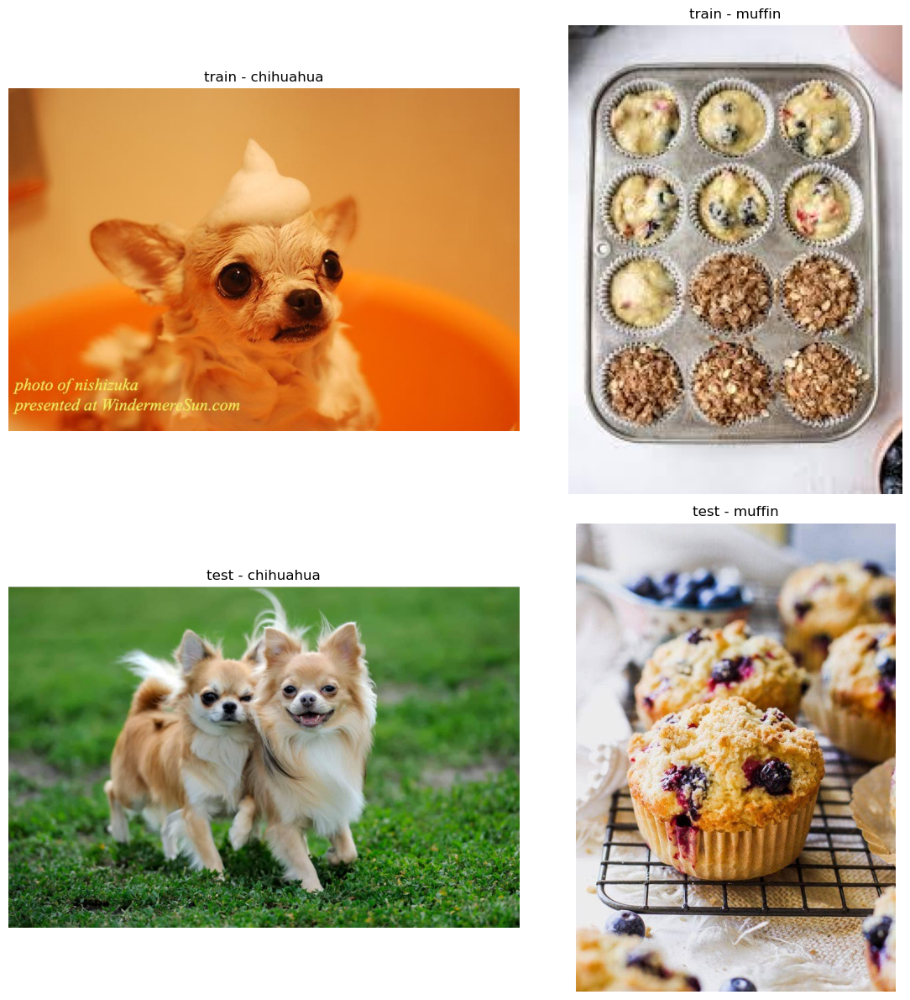

In [20]:
# set random seed for reproducibility
np.random.seed(42)

# display sample images
display_sample_images(PATH_DATA_RAW)

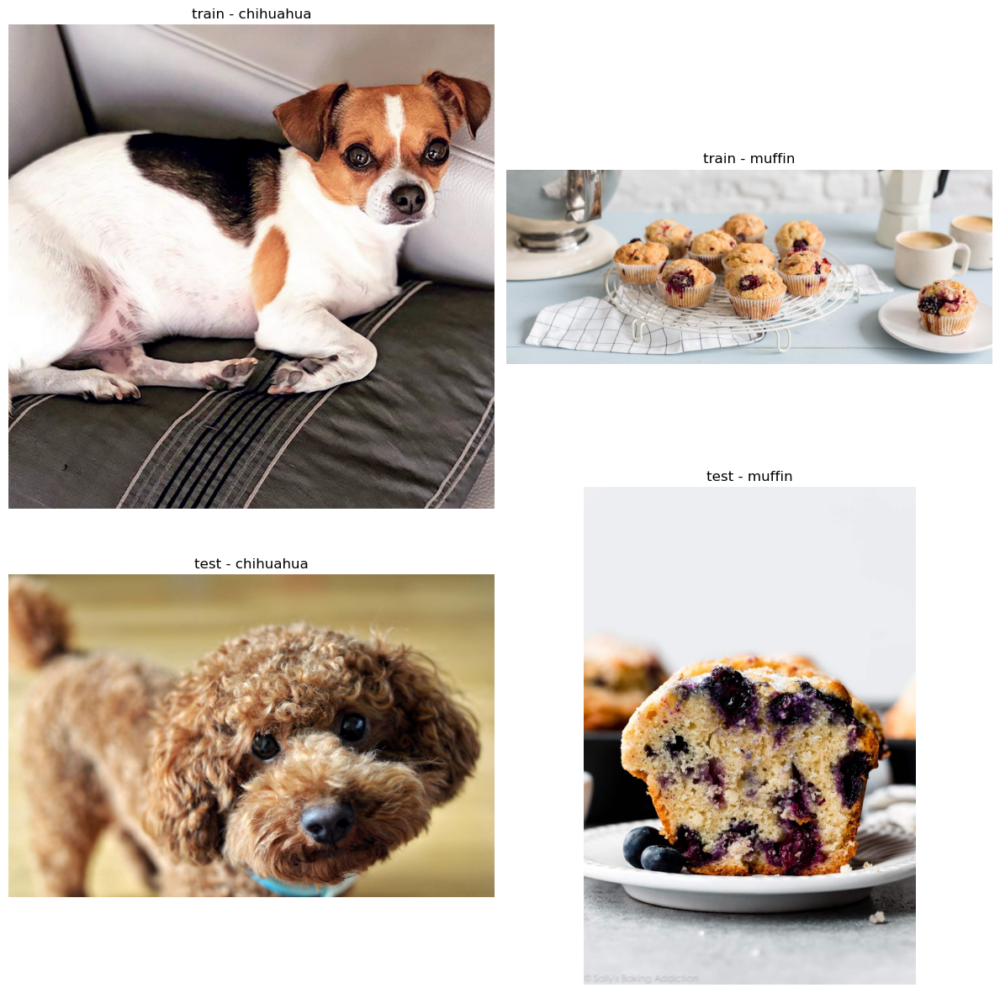

In [21]:
# display sample images
display_sample_images(PATH_DATA_RAW)

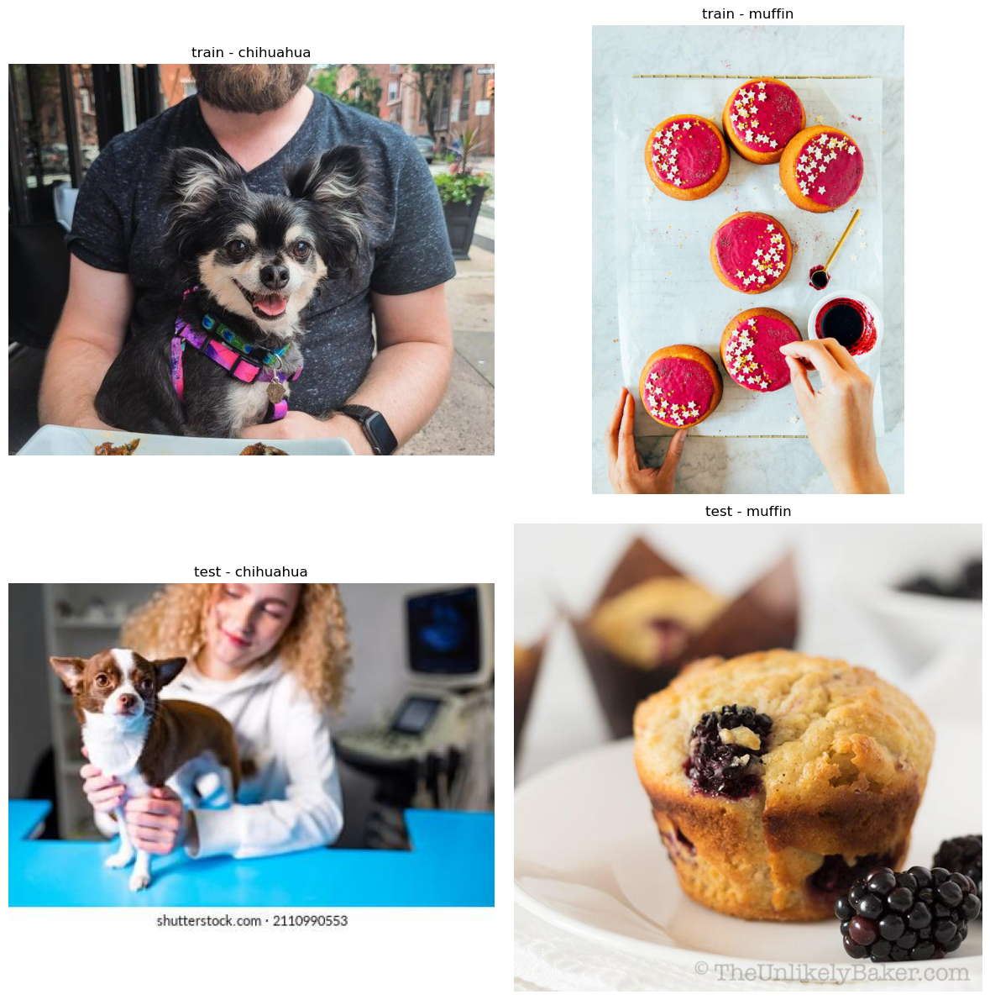

In [22]:
# display sample images
display_sample_images(PATH_DATA_RAW)

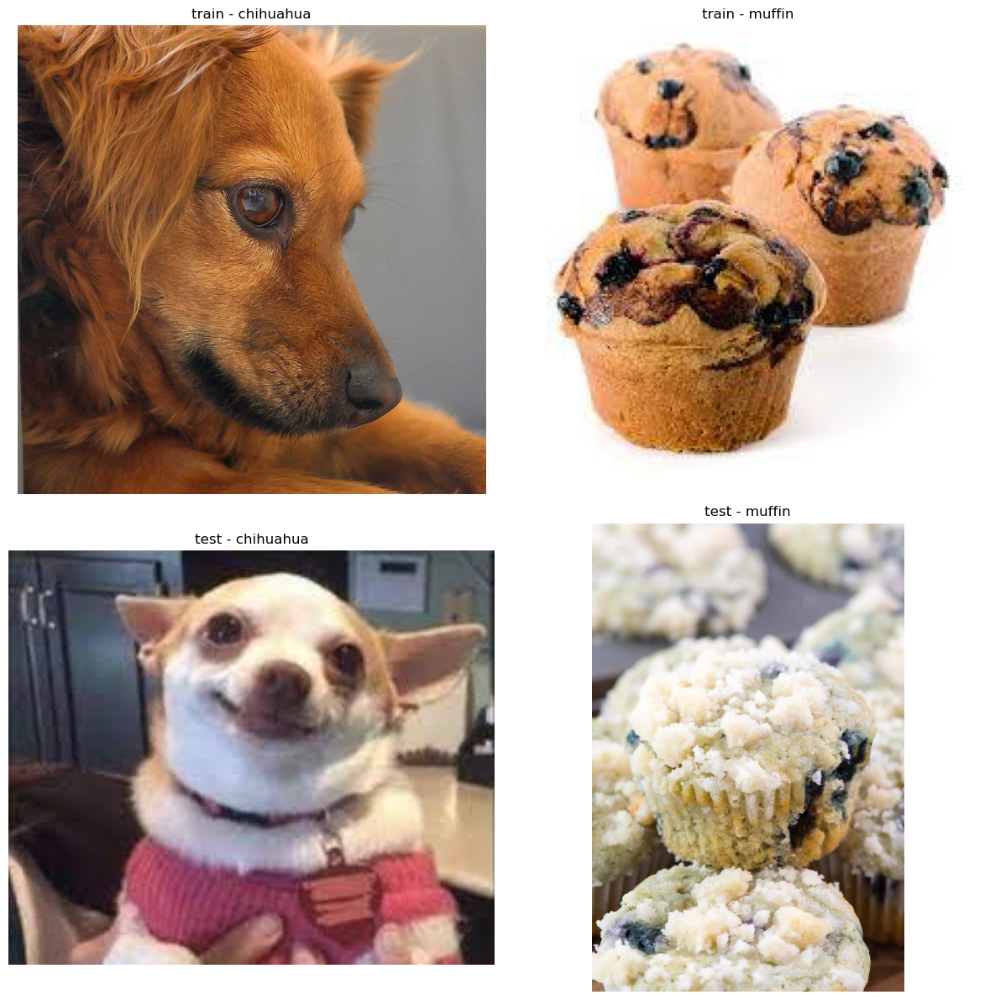

In [23]:
# display sample images
display_sample_images(PATH_DATA_RAW)

lol this one's a meme :D

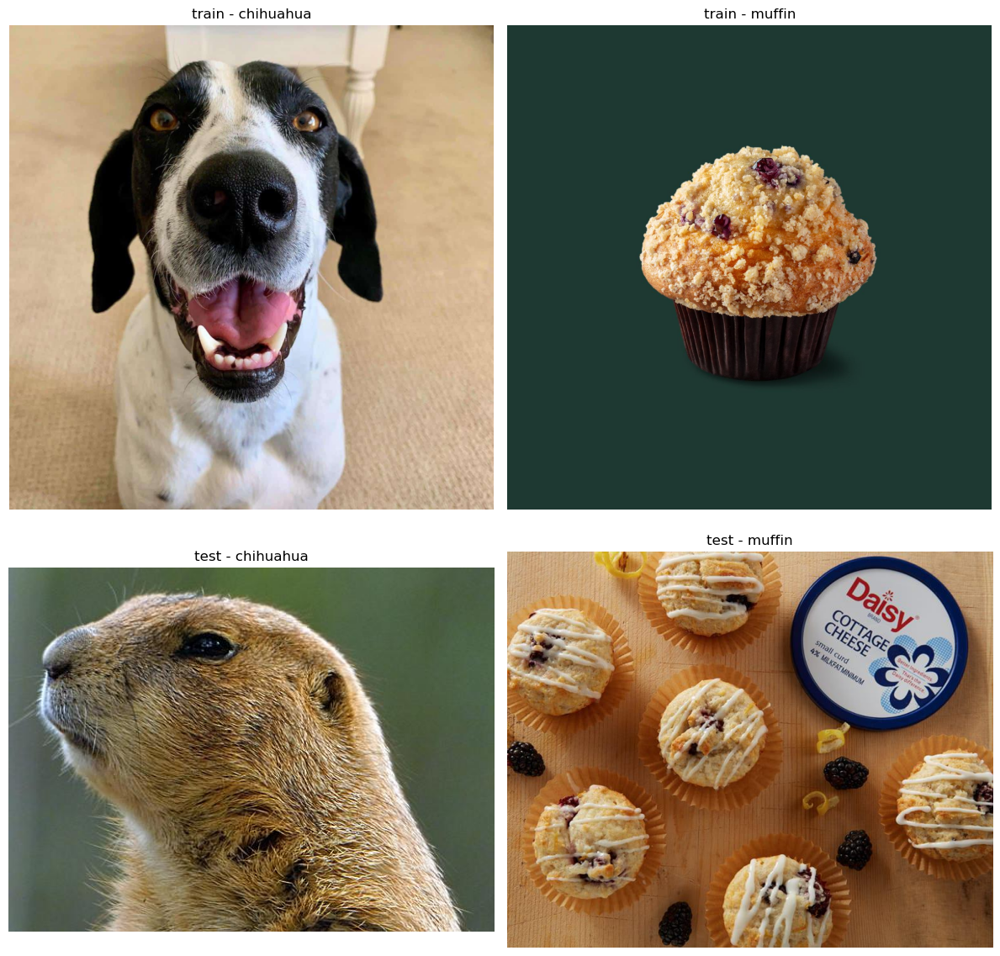

In [24]:
# display sample images
display_sample_images(PATH_DATA_RAW)

lol this one is not even a dog :D

Above, 20 images from both classes's train and test set were printed.
All in all, the quality of the data looks okay.
The sample drawn is not too large, but it gives a first impression.
The data set seems to contain some images that don't belong there.
For example, there is some other animal looking similar to a groundhog in the
chihuahua test set.
Also, not all of the dogs are chihuahuas.
This means the data is not perfectly suitable for this problem.
Still, most dog images seen so far actually contain chihuahuas.
The presence of the other animals may influence the model's
decisions, even though it is difficult to predict in which way.
For the muffins, most images look fine, as far I can say.
Finally, however, some images contain text, which may also affect the model's
decisions in some way.

## Verify Class Distribution

Check the number of images in each class for both the training and test sets to
see if there are any major class imbalances.
In the web interface I already saw that there are more images of chihuahuas
than muffins, but the severity needs to be checked again.


In [25]:
# check class distribution
class_distribution = check_class_distribution(PATH_DATA_RAW)
class_distribution

{'train': Counter({'chihuahua': 2559, 'muffin': 2174}),
 'test': Counter({'chihuahua': 640, 'muffin': 544})}

In [26]:
# access and print values in informative way
n_train_chihuahua = class_distribution['train']['chihuahua']
n_train_muffin = class_distribution['train']['muffin']
n_test_chihuahua = class_distribution['test']['chihuahua']
n_test_muffin = class_distribution['test']['muffin']
n_total_chihuahua = n_train_chihuahua + n_test_chihuahua
n_total_muffin = n_train_muffin + n_test_muffin
n_total_images = n_total_chihuahua + n_total_muffin
fraction_train = (n_train_chihuahua + n_train_muffin) / n_total_images
fraction_test = (n_test_chihuahua + n_test_muffin) / n_total_images
fraction_chihuahua = n_total_chihuahua / n_total_images
fraction_muffin = n_total_muffin / n_total_images

print(f"Total number of images: {n_total_images}")
print(f"Images in train set: {n_train_chihuahua + n_train_muffin} ({fraction_train * 100:.2f}%)")
print(f"Images in test set: {n_test_chihuahua + n_test_muffin} ({fraction_test * 100:.2f}%)")
print(f"Chihuahuas: {n_total_chihuahua} ({n_train_chihuahua} train, {n_test_chihuahua} test, {fraction_chihuahua * 100:.2f}%)")
print(f"Muffins: {n_total_muffin} ({n_train_muffin} train, {n_test_muffin} test, {fraction_muffin * 100:.2f}%)")

Total number of images: 5917
Images in train set: 4733 (79.99%)
Images in test set: 1184 (20.01%)
Chihuahuas: 3199 (2559 train, 640 test, 54.06%)
Muffins: 2718 (2174 train, 544 test, 45.94%)


The data set contains close to 6000 images, which is likely an appropriate size.
About 80% of the images are in the train set, an 20% in the test set, which is
common practice.

The classes are slightly imbalanced.
About 54% of images are (supposed to be) chihuahuas,
while about 46% are of muffins.
This is not a major imbalance, and thus still acceptible.

## Check Image Dimensions

Ensure that all images are of the same size or identify any resizing that may be necessary.

In [27]:
# check image dimensions
image_dimensions = check_image_dimensions(PATH_DATA_RAW)

Train Set:
  Number of Images: 4733
  Widths: Min=102, Max=4603, Mean=756.97, Std=546.44
  Heights: Min=129, Max=4032, Mean=730.89, Std=554.72

Test Set:
  Number of Images: 1184
  Widths: Min=168, Max=4032, Mean=797.52, Std=552.45
  Heights: Min=136, Max=4096, Mean=765.56, Std=576.74



There is a significant variation in image dimensions.
They need to be resized to be used in a machine learning pipeline.
224x224 is a commonly used size for this, and is compatible with many pre-
trained models.

In [28]:
# create directory for processed data
PATH_DATA_PROCESSED.mkdir(parents=True, exist_ok=True)
# resize images to 224x224 and save in processed directory
resize_images(
    data_dir = PATH_DATA_RAW,
    processed_dir = PATH_DATA_PROCESSED,
    target_size=(224, 224))
print("Images resized to 224x224 and saved in data/processed/.")

Images resized to 224x224 and saved in data/processed/.


Display some of the transformed images.

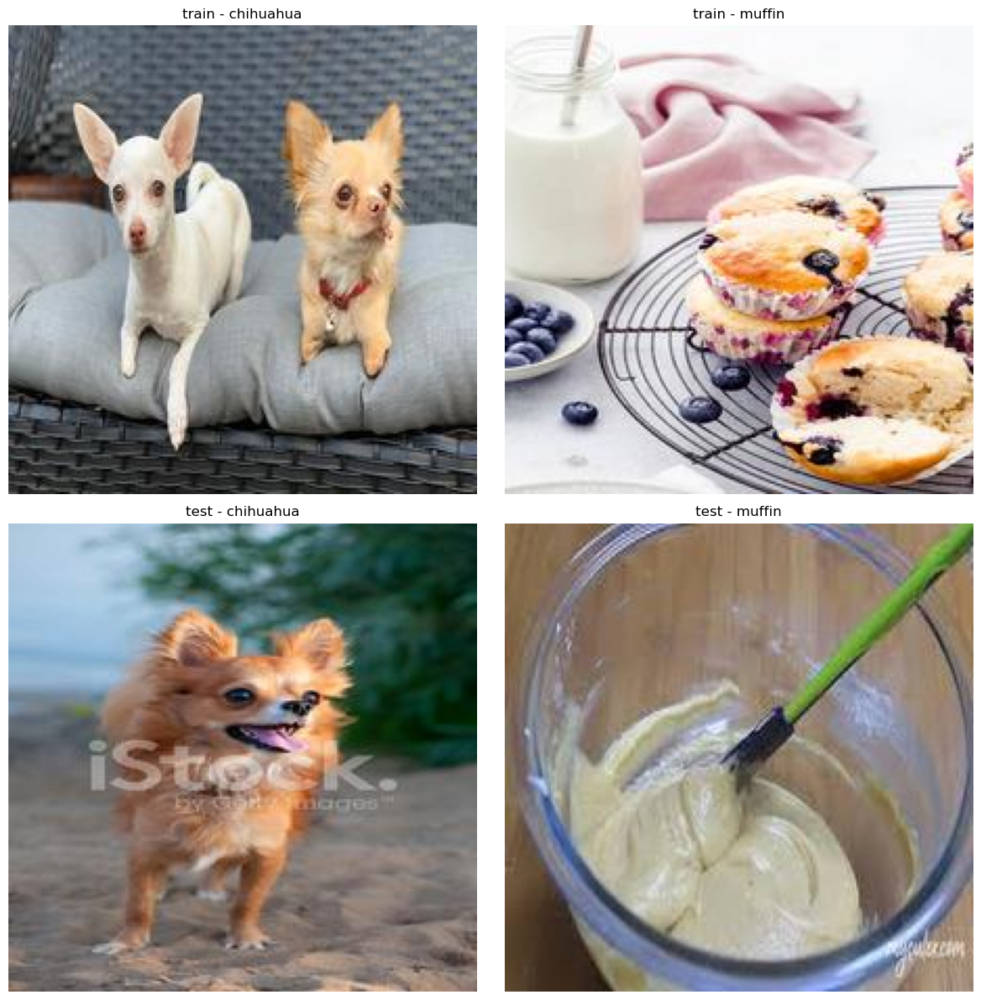

In [29]:
display_sample_images(PATH_DATA_PROCESSED)

Image sizes look fine. Let's now have a closer look at the dimensions again.

Still one comment: This one image in the test set of muffins is pretty misplaced
here.
I assume it ended up during downloading the images using an image search API
and came from a recipe page.
For now I won't do anything about it, and check how the model does first.

In [30]:
# check image dimensions after transformation
image_dimensions_processed = check_image_dimensions(PATH_DATA_PROCESSED)

Train Set:
  Number of Images: 4733
  Widths: Min=224, Max=224, Mean=224.00, Std=0.00
  Heights: Min=224, Max=224, Mean=224.00, Std=0.00

Test Set:
  Number of Images: 1184
  Widths: Min=224, Max=224, Mean=224.00, Std=0.00
  Heights: Min=224, Max=224, Mean=224.00, Std=0.00



### Check the Color Channels

In [31]:
# check color channels
check_color_channels(PATH_DATA_PROCESSED)

Images with 1 channels: 4 (0.07%)
(These are grayscale images)
Images with 3 channels: 5913 (99.93%)
(These are RGB images)


There are four out of 5913 grayscale images,
which corresponds to 0.07%.
For training a model, the images' color channels need to be
standardized.
Due to the tiny fraction, I will remove the images instead of
converting them to RGB by replicating their single channel.

In [32]:
def remove_grayscale_images(data_dir):
    """Remove grayscale images from the processed dataset."""
    splits = ["train", "test"]
    removed_files = []
    
    for split in splits:
        for cls in ["chihuahua", "muffin"]:
            path = data_dir / split / cls
            for img_path in path.glob("*"):
                img = Image.open(img_path)
                if len(img.getbands()) == 1:  # if grayscale
                    img_path.unlink()  # delete the file
                    removed_files.append(str(img_path))
    
    print(f"Removed {len(removed_files)} grayscale images:")
    for file in removed_files:
        print(f"- {file}")

# remove grayscale images
remove_grayscale_images(PATH_DATA_PROCESSED)

Removed 4 grayscale images:
- ../data/processed/train/chihuahua/img_0_789.jpg
- ../data/processed/train/chihuahua/img_0_987.jpg
- ../data/processed/train/chihuahua/img_0_750.jpg
- ../data/processed/test/muffin/img_4_642.jpg


We previously checked the class distribution.
Removing four images will not noticeably affect it.
Still, the new distribution will be printed here.

In [33]:
# check new class distribution
class_distribution_processed = check_class_distribution(PATH_DATA_PROCESSED)
class_distribution_processed

{'train': Counter({'chihuahua': 2556, 'muffin': 2174}),
 'test': Counter({'chihuahua': 640, 'muffin': 543})}

As expected, it is close to the same as before.
Now, the critical steps are completed.
I will move on to train a model now.
The other ideas mentioned at the beginning of this notebook are not
critical for being able to train a model on the data.

I may come back here and add some more EDA, but for now I will focus
on completing the project before trying to make every piece perfect.